## Reinforcement Learning 
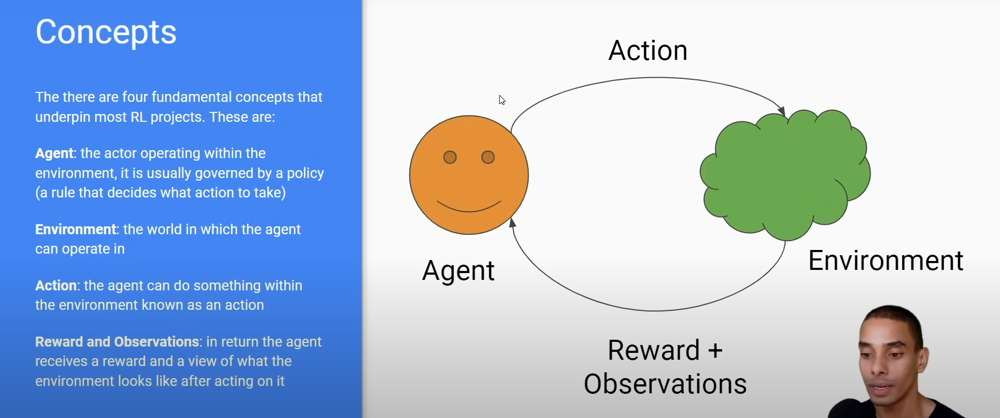

In [2]:
import sys
sys.path.append(r'C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages')  # Replace with the actual path
import gym 

In [1]:
# install stable-baselines3
!pip install stable-baselines3[extra]

  Using cached stable_baselines3-2.5.0-py3-none-any.whl.metadata (4.8 kB)
  Using cached gymnasium-1.0.0-py3-none-any.whl.metadata (9.5 kB)
  Using cached pandas-2.2.3-cp312-cp312-win_amd64.whl.metadata (19 kB)
  Using cached tensorboard-2.18.0-py3-none-any.whl.metadata (1.6 kB)
  Using cached psutil-6.1.1-cp37-abi3-win_amd64.whl.metadata (23 kB)
  Using cached tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
  Using cached rich-13.9.4-py3-none-any.whl.metadata (18 kB)
  Using cached typing_extensions-4.12.2-py3-none-any.whl.metadata (3.0 kB)
  Using cached absl_py-2.1.0-py3-none-any.whl.metadata (2.3 kB)
  Using cached Markdown-3.7-py3-none-any.whl.metadata (7.0 kB)
  Using cached packaging-24.2-py3-none-any.whl.metadata (3.2 kB)
  Using cached protobuf-5.29.3-cp310-abi3-win_amd64.whl.metadata (592 bytes)
  Using cached six-1.17.0-py2.py3-none-any.whl.metadata (1.7 kB)
  Using cached tensorboard_data_server-0.7.2-py3-none-any.whl.metadata (1.1 kB)
  Using cached werkzeug-3.1.3-py3-none-a

In [9]:
!pip show gym

Name: gym
Version: 0.26.2
Summary: Gym: A universal API for reinforcement learning environments
Home-page: https://www.gymlibrary.dev/
Author: Gym Community
Author-email: jkterry@umd.edu
License: MIT
Location: C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages
Requires: cloudpickle, gym_notices, numpy
Required-by: 


In [67]:
!pip install shimmy

In [3]:
import os
import gym # build evironments and allows working with existing envs
from stable_baselines3 import PPO # RL algorithm
from stable_baselines3.common.vec_env import DummyVecEnv # vectorize environments
from stable_baselines3.common.evaluation import evaluate_policy # test how model is performing

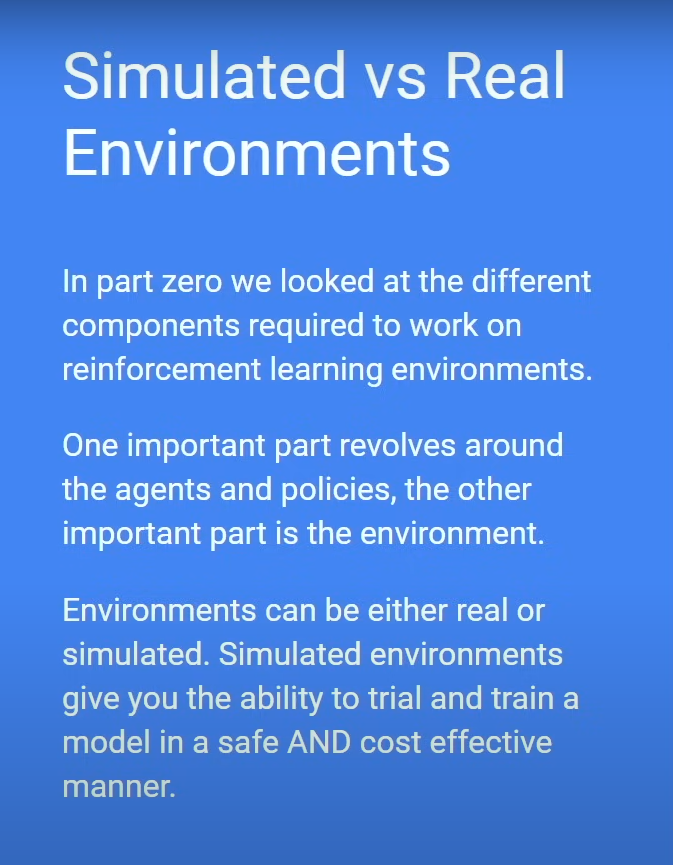
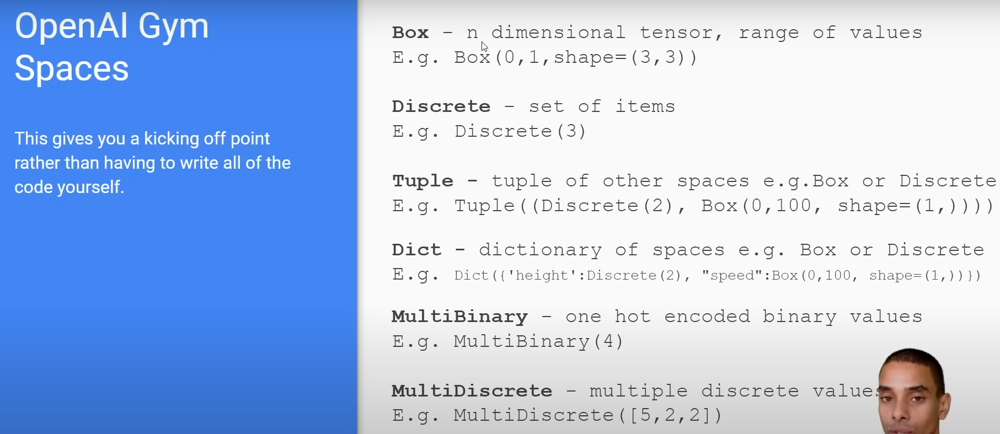

In [5]:
## Simulated vs Real Envs

# 1. Initiate Envs
env_name = 'CartPole-v0'
env = gym.make(env_name, render_mode="human")

C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\gym\envs\registration.py:555: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(


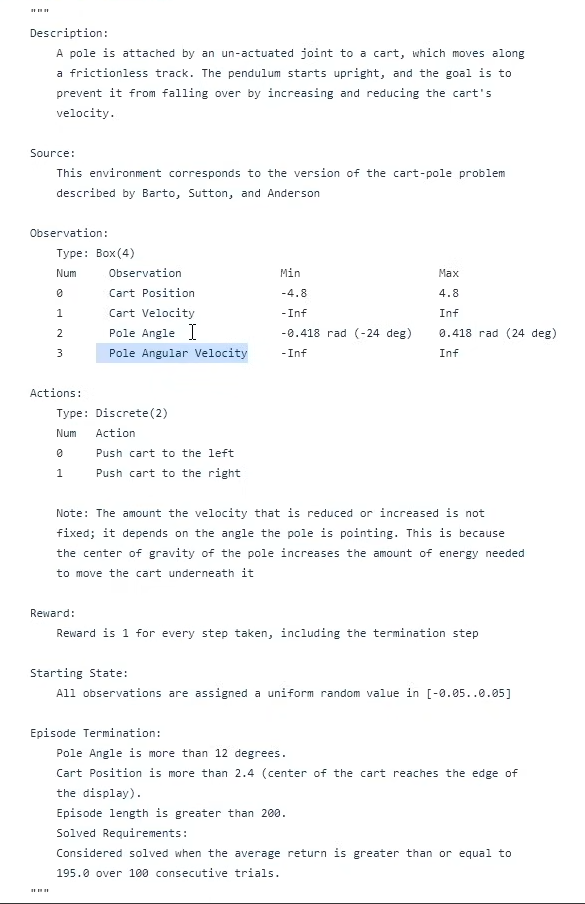

In [6]:
# test the environment: knowing the environment before implmenting to design the approach
episodes = 5
for episode in range(1, episodes + 1):
    state = env.reset()
    done = False
    score = 0

    while not done:
        env.render()
        action = env.action_space.sample()
        n_state, reward, done, _, info = env.step(action)
        score += reward
    print('Episode:{} Score:{}'.format(episode, score))
env.close()

C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Episode:1 Score:30.0
Episode:2 Score:49.0
Episode:3 Score:14.0
Episode:4 Score:23.0
Episode:5 Score:28.0


In [7]:
## understand the env 

In [7]:
env.action_space

Discrete(2)

In [8]:
env.action_space.sample()

1

In [10]:
env.observation_space

Box([-4.8000002e+00 -3.4028235e+38 -4.1887903e-01 -3.4028235e+38], [4.8000002e+00 3.4028235e+38 4.1887903e-01 3.4028235e+38], (4,), float32)

In [9]:
env.observation_space.sample()

array([-3.3493428e+00, -6.4700572e+37, -3.0497617e-01, -9.1767225e+37],
      dtype=float32)

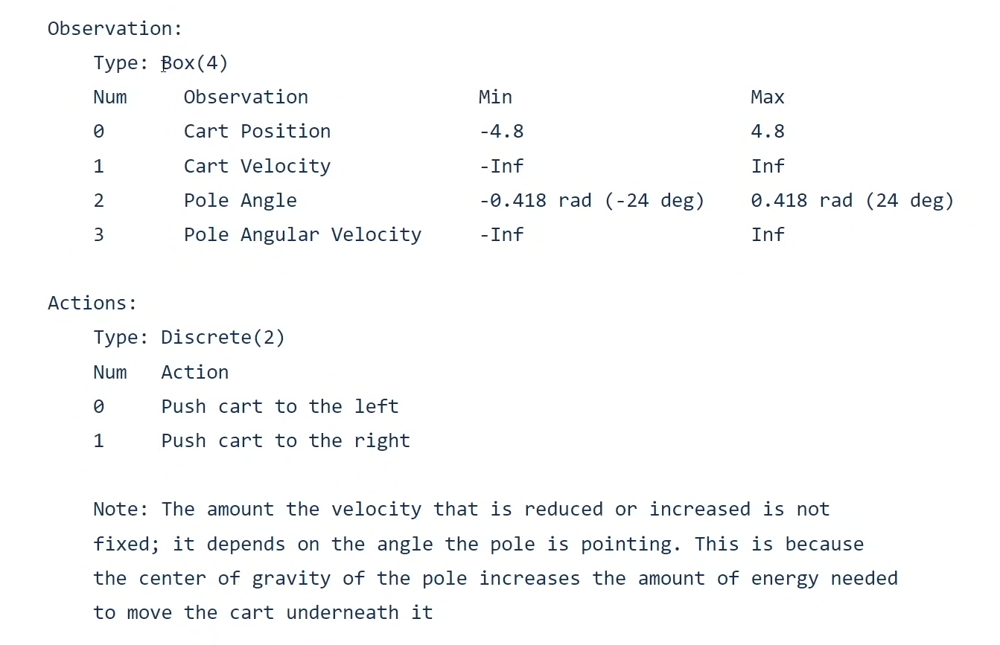

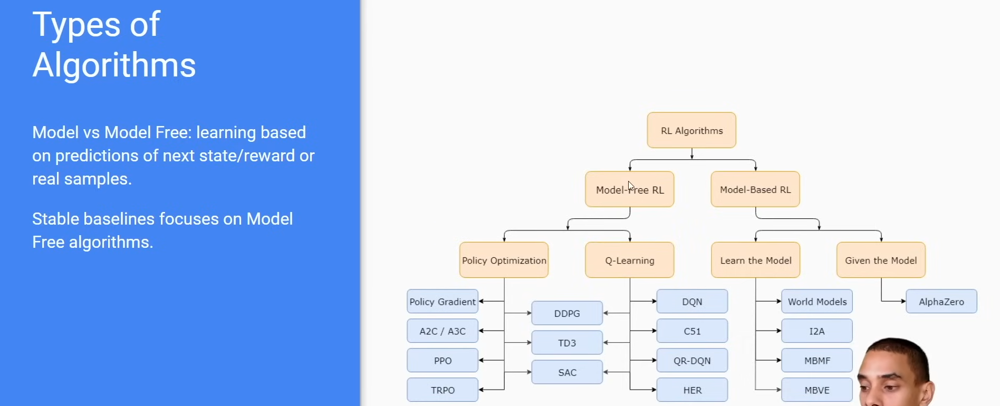
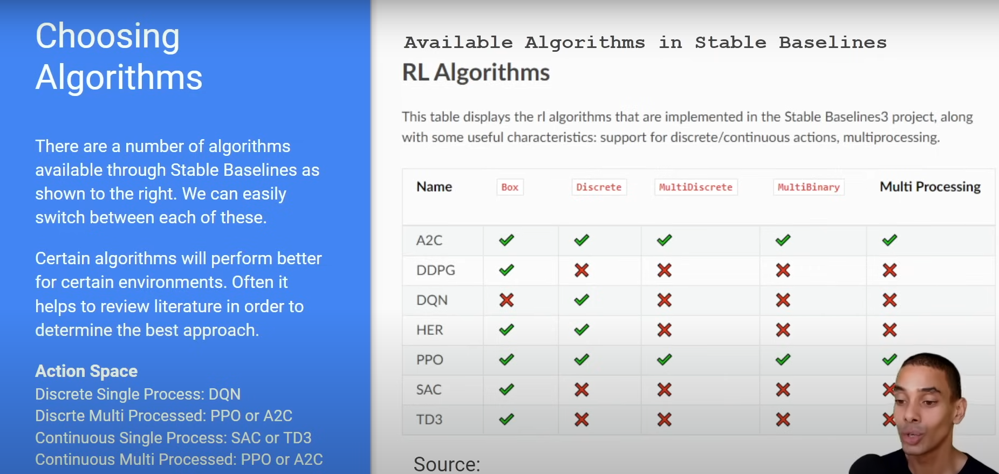
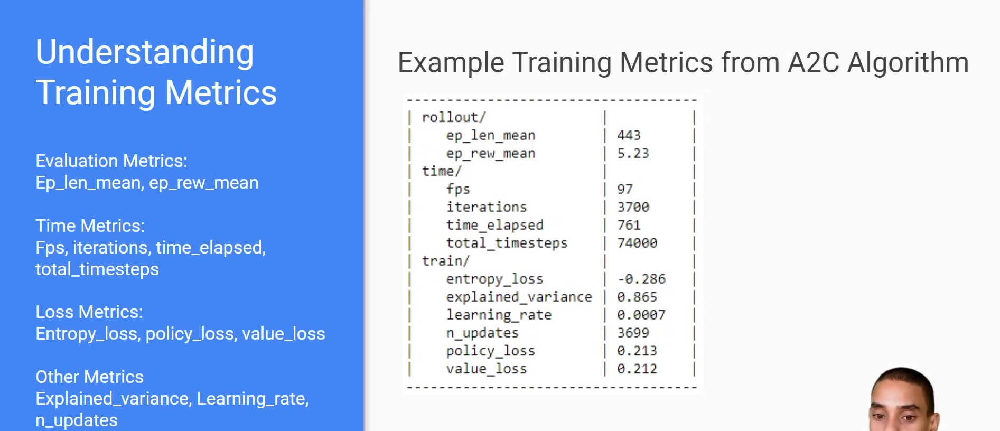

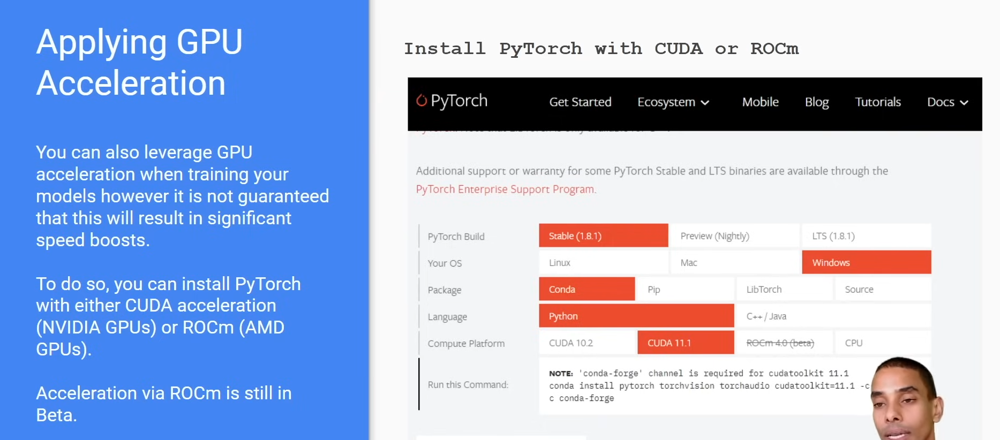

In [10]:
## Train the RL
log_path = os.path.join('Training', 'Logs')
model_path =os.path.join('Training', 'Models')

if not os.path.exists(log_path):
    os.makedirs(log_path)
    print(f"Folder created at: {log_path}")
else:
    print(f"Folder already exists at: {log_path}")

if not os.path.exists(model_path):
    os.makedirs(model_path)
    print(f"Folder created at: {model_path}")
else:
    print(f"Folder already exists at: {model_path}")

Folder already exists at: Training\Logs
Folder already exists at: Training\Models


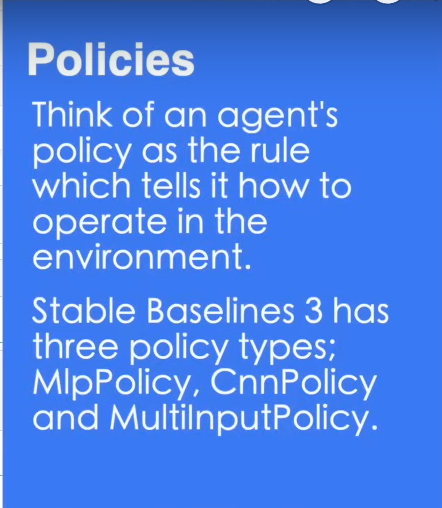

In [11]:
## 
env = gym.make(env_name, render_mode='human') # creating environment
env = DummyVecEnv([lambda: env]) # wrapped our env inside DummyVecEnv wrapper 
model = PPO('MlpPolicy', env, verbose=1, tensorboard_log=log_path) # initialize model with policy=MlpPolicy and env

C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\gym\envs\registration.py:555: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(
C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\stable_baselines3\common\vec_env\patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


Using cuda device


C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


In [35]:
PPO??

Init signature:
PPO(
    policy: Union[str, type[stable_baselines3.common.policies.ActorCriticPolicy]],
    env: Union[gymnasium.core.Env, ForwardRef('VecEnv'), str],
    learning_rate: Union[float, Callable[[float], float]] = 0.0003,
    n_steps: int = 2048,
    batch_size: int = 64,
    n_epochs: int = 10,
    gamma: float = 0.99,
    gae_lambda: float = 0.95,
    clip_range: Union[float, Callable[[float], float]] = 0.2,
    clip_range_vf: Union[NoneType, float, Callable[[float], float]] = None,
    normalize_advantage: bool = True,
    ent_coef: float = 0.0,
    vf_coef: float = 0.5,
    max_grad_norm: float = 0.5,
    use_sde: bool = False,
    sde_sample_freq: int = -1,
    rollout_buffer_class: Optional[type[stable_baselines3.common.buffers.RolloutBuffer]] = None,
    rollout_buffer_kwargs: Optional[dict[str, Any]] = None,
    target_kl: Optional[float] = None,
    stats_window_size: int = 100,
    tensorboard_log: Optional[str] = None,
    policy_kwargs: Optional[dict[str, Any]]

In [36]:
model.learn(total_timesteps=20000)

Logging to Training\Logs\PPO_5


C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


-----------------------------
| time/              |      |
|    fps             | 45   |
|    iterations      | 1    |
|    time_elapsed    | 45   |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 45          |
|    iterations           | 2           |
|    time_elapsed         | 90          |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.007915296 |
|    clip_fraction        | 0.0871      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.687      |
|    explained_variance   | -0.00984    |
|    learning_rate        | 0.0003      |
|    loss                 | 8.09        |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.0138     |
|    value_loss           | 54.7        |
-----------------------------------------
----------------------------------

In [37]:
PPO_path = os.path.join(model_path, 'PPO_model_cartpole_v0')

In [38]:
model.save(PPO_path) # save model

In [39]:
del model ## deleting current model object

In [40]:
# loading saved model
model = PPO.load(PPO_path, env=env)

C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


In [41]:
## we can even train the loaded model 
model.learn(total_timesteps=1000)

Logging to Training\Logs\PPO_6
-----------------------------
| time/              |      |
|    fps             | 48   |
|    iterations      | 1    |
|    time_elapsed    | 42   |
|    total_timesteps | 2048 |
-----------------------------


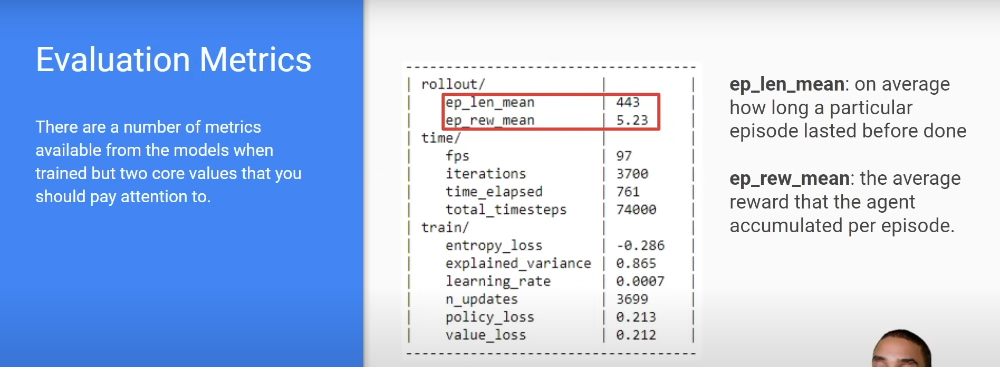

In [42]:
## Testing and Evaluation
evaluate_policy(model, env, n_eval_episodes=10, render=True)

C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\stable_baselines3\common\evaluation.py:67: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


(200.0, 0.0)

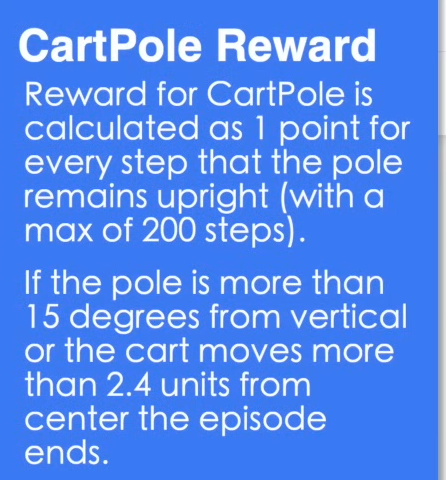

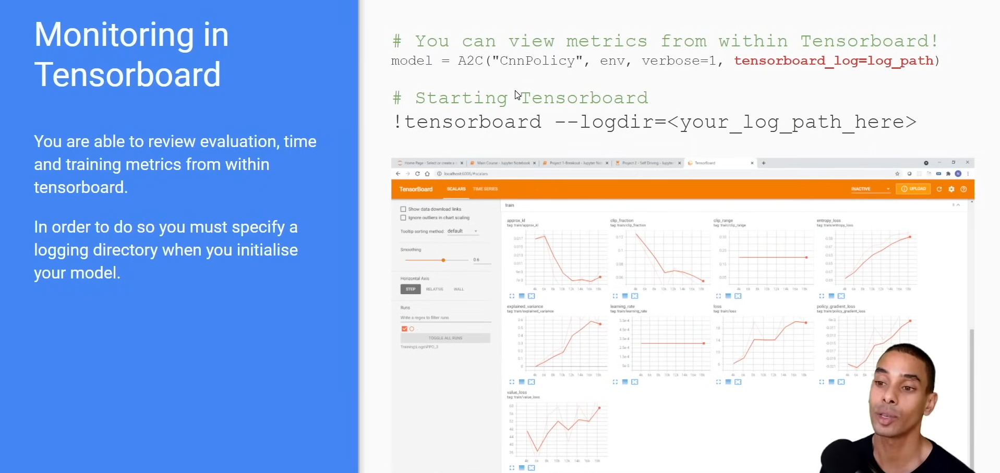

In [43]:
## Test The model 
episodes = 5
for episode in range(1, episodes + 1):
    obs = env.reset()
    done = False
    score = 0

    while not done:
        env.render()
        action, _states = model.predict(obs) # now using model here
        obs, reward, done, info = env.step(action)
        score += reward
    print('Episode:{} Score:{}'.format(episode, score))
#env.close()

Episode:1 Score:[200.]
Episode:2 Score:[200.]
Episode:3 Score:[200.]
Episode:4 Score:[200.]
Episode:5 Score:[61.]


In [44]:
## here score is not good

In [46]:
## get state, reward
state, reward, *_ = env.step(action)
state, reward

(array([[ 0.00145846, -0.391726  ,  0.01810315,  0.616889  ]],
       dtype=float32),
 array([1.], dtype=float32))

In [47]:
## visualize training to get ingights and understand how training went 
# run in cmd otherwise it will lock the notebook 
training_log_path = os.path.join(log_path, 'PPO_5')

In [50]:
!tensorboard --logdir={training_log_path}

UsageError: Line magic function `%` not found.


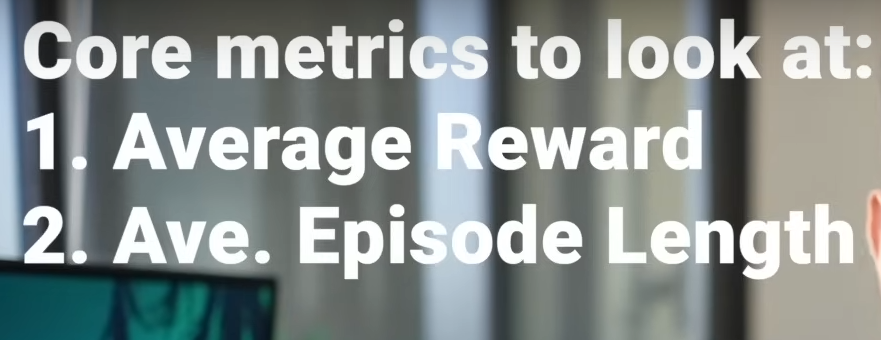
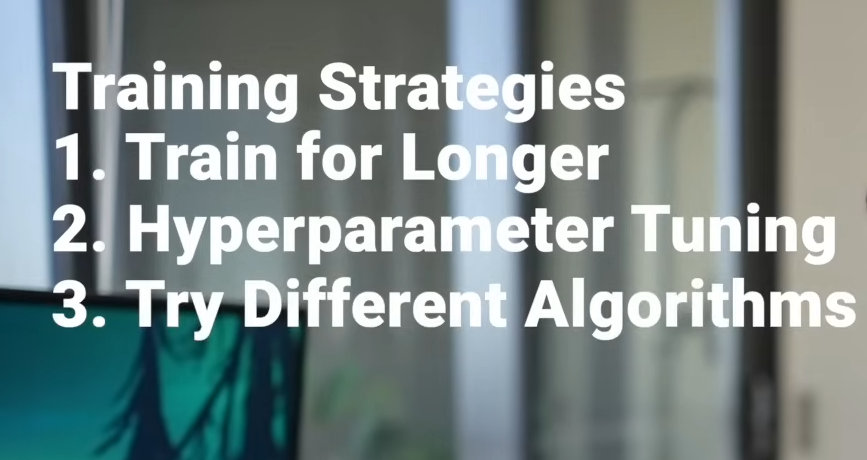

In [ ]:
## Callbacks, alt. algos and architecture


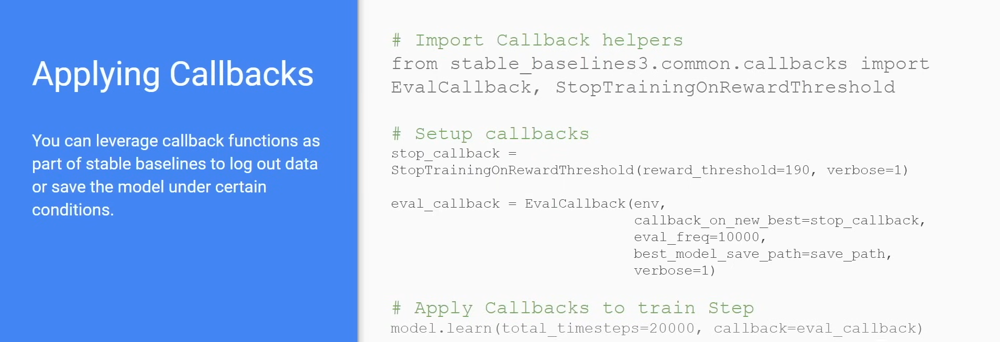

In [53]:
## import libraries
# StopTrainingOnRewardThreshold kind of a checker which check if model passed a certain reward threshold 
# EvalCallback : callback for agent evaluation that will run with training
from stable_baselines3.common.callbacks import EvalCallback, StopTrainingOnRewardThreshold

In [56]:
save_path = os.path.join('Training', 'Models')

In [57]:
stop_callback = StopTrainingOnRewardThreshold(reward_threshold=200, verbose=1)
eval_callback = EvalCallback(env,
                            callback_after_eval=stop_callback,
                            eval_freq=10000,
                            best_model_save_path=save_path, 
                            verbose=1)

In [58]:
model = PPO('MlpPolicy', env, verbose=1, tensorboard_log=log_path)

Using cuda device


C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


In [59]:
model.learn(total_timesteps=20000, callback=eval_callback)

Logging to Training\Logs\PPO_7
-----------------------------
| time/              |      |
|    fps             | 46   |
|    iterations      | 1    |
|    time_elapsed    | 44   |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 45          |
|    iterations           | 2           |
|    time_elapsed         | 89          |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.008719671 |
|    clip_fraction        | 0.0923      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.687      |
|    explained_variance   | 0.000196    |
|    learning_rate        | 0.0003      |
|    loss                 | 6.8         |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.0138     |
|    value_loss           | 49.5        |
-----------------------------------------
---

C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\stable_baselines3\common\evaluation.py:67: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=10000, episode_reward=193.00 +/- 14.00
Episode length: 193.00 +/- 14.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 193          |
|    mean_reward          | 193          |
| time/                   |              |
|    total_timesteps      | 10000        |
| train/                  |              |
|    approx_kl            | 0.0066716988 |
|    clip_fraction        | 0.0666       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.612       |
|    explained_variance   | 0.266        |
|    learning_rate        | 0.0003       |
|    loss                 | 26.7         |
|    n_updates            | 40           |
|    policy_gradient_loss | -0.0159      |
|    value_loss           | 65.6         |
------------------------------------------
New best mean reward!
------------------------------
| time/              |       |
|    fps             | 41    |
|    iterations     

#### Different NN Architecture
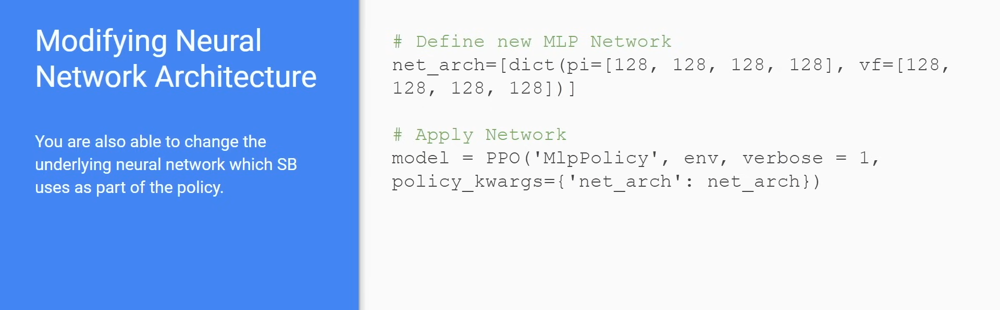
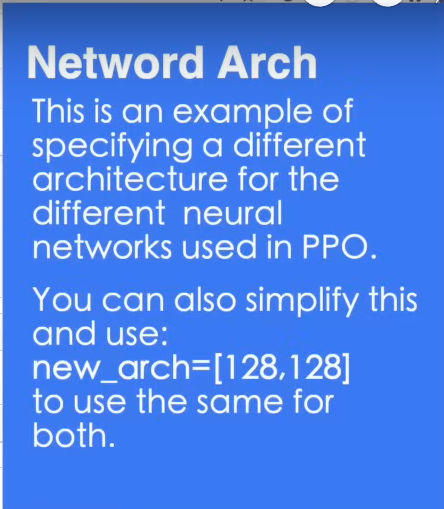

In [61]:
## Change policy 
# this is akin to change number of units or number of layers inside NN
net_arch = [ dict(pi=[128, 128, 128, 128], vf=[128, 128, 128, 128])]

In [62]:
model = PPO('MlpPolicy', env, verbose=1, tensorboard_log=log_path, policy_kwargs={'net_arch': net_arch})

Using cuda device


C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\stable_baselines3\common\policies.py:486: UserWarning: As shared layers in the mlp_extractor are removed since SB3 v1.8.0, you should now pass directly a dictionary and not a list (net_arch=dict(pi=..., vf=...) instead of net_arch=[dict(pi=..., vf=...)])
  warnings.warn(
C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


In [63]:
model.learn(total_timesteps=20000, callback=eval_callback)

Logging to Training\Logs\PPO_8
-----------------------------
| time/              |      |
|    fps             | 46   |
|    iterations      | 1    |
|    time_elapsed    | 44   |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 45          |
|    iterations           | 2           |
|    time_elapsed         | 90          |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.015577816 |
|    clip_fraction        | 0.252       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.681      |
|    explained_variance   | 0.0118      |
|    learning_rate        | 0.0003      |
|    loss                 | 1.5         |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.0268     |
|    value_loss           | 18.1        |
-----------------------------------------
---

C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\stable_baselines3\common\evaluation.py:67: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=10000, episode_reward=200.00 +/- 0.00
Episode length: 200.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 200         |
|    mean_reward          | 200         |
| time/                   |             |
|    total_timesteps      | 10000       |
| train/                  |             |
|    approx_kl            | 0.009191561 |
|    clip_fraction        | 0.137       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.569      |
|    explained_variance   | 0.461       |
|    learning_rate        | 0.0003      |
|    loss                 | 18.7        |
|    n_updates            | 40          |
|    policy_gradient_loss | -0.02       |
|    value_loss           | 46.3        |
-----------------------------------------
Stopping training because the mean reward 200.00  is above the threshold 200


#### Use Different Algo
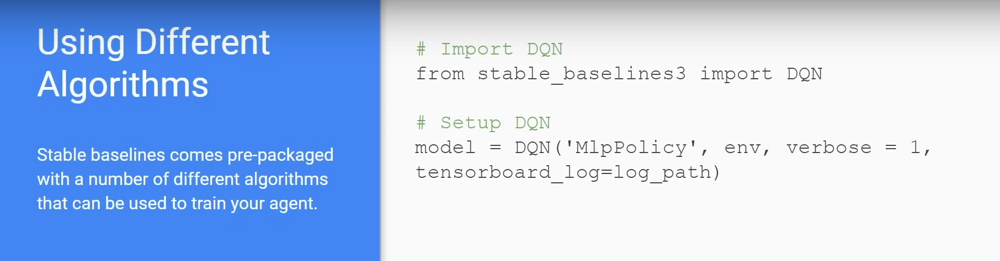

In [4]:
from stable_baselines3 import DQN

In [12]:
model = DQN('MlpPolicy', env, verbose=1, tensorboard_log=log_path)

Using cuda device


In [ ]:
model.learn(total_timesteps=20000)

Logging to Training\Logs\DQN_1


C:\REINFORCEMENT_LEARNING\.venv\Lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


----------------------------------
| rollout/            |          |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 42       |
|    time_elapsed     | 1        |
|    total_timesteps  | 67       |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 34       |
|    time_elapsed     | 4        |
|    total_timesteps  | 145      |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.551    |
|    n_updates        | 11       |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 38       |
|    time_elapsed   